In [1]:
import sys, os, toml
sys.path.append(os.path.join(sys.path[0], '..', 'endure'))
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from copy import deepcopy

from IPython.display import display, HTML

In [2]:
from experiments.dataio import Writer, Reader
config = Reader.read_config(os.path.join(sys.path[0], '..', 'endure', 'config', 'endure.toml'))
reader = Reader(config)
writer = Writer(config)

In [3]:
from lsmtree.cost import EndureQFixedCost, EndureTierLevelCost, EndureKHybridCost
from lsmtree.lsmtype import LSMTree, LSMSystem, Policy

def wl_to_array(wl_dict):
    return (wl_dict['id'], wl_dict['z0'], wl_dict['z1'], wl_dict['q'], wl_dict['w'])

In [4]:
system_vars = LSMSystem(**config['system'])
# tl_cf = EndureTierLevelCost(**config['system'])
# q_cf = EndureQFixedCost(**config['system'])
# k_cf = EndureKHybridCost(**config['system'])

# Pre-processing

In [5]:
df = reader.read_csv('cost_surface_q_cost.csv')

landscape = (
    df.groupby(['wl_id', 'h', 'T'])[['new_cost', 'old_cost']]
        .min()
        .reset_index()
        .assign(
            new_tp=lambda row: 1 / row['new_cost'],
            old_tp=lambda row: 1 / row['old_cost'],
        )
        .assign(
            speedup=lambda row: row['new_tp'] / row['old_tp'],
        )
)

df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
wl_id,367500.0,7.000000,4.320500,0.000000,3.000000,7.000000,11.000000,14.000000
h,367500.0,4.750000,2.883145,0.000000,2.375000,4.750000,7.125000,9.500000
T,367500.0,66.979592,23.317267,2.000000,50.000000,70.000000,86.000000,98.000000
z0,367500.0,0.250000,0.272471,0.010000,0.010000,0.250000,0.490000,0.970000
z1,367500.0,0.250000,0.272471,0.010000,0.010000,0.250000,0.490000,0.970000
q,367500.0,0.250000,0.272471,0.010000,0.010000,0.250000,0.490000,0.970000
w,367500.0,0.250000,0.272471,0.010000,0.010000,0.250000,0.490000,0.970000
Q,367500.0,33.489796,23.322196,1.000000,14.000000,29.000000,50.000000,97.000000
new_cost,367500.0,19.004171,22.126982,0.157824,2.950520,10.076865,28.043765,199.178845
tier_cost,367500.0,36.140703,34.144745,0.256570,4.703571,30.723728,55.333990,199.178845


# Plotting Functions

In [6]:
def heatmap(data, rows, cols, ax=None, row_label='', col_label='', cbar_label='', title=''):
    if not ax:
        ax = plt.gca()
    im = ax.imshow(data)
    im_ratio = data.shape[0] / data.shape[1]
    cbar = ax.figure.colorbar(im, ax=ax, fraction=0.047*im_ratio)
    cbar.ax.set_ylabel(cbar_label, rotation=-90, va='bottom')
    ax.set_xticks(np.arange(len(rows)), labels=rows)
    ax.set_xlabel(row_label)
    ax.set_yticks(np.arange(len(cols)), labels=cols)
    ax.set_ylabel(col_label)
    ax.set_title(title)
    
    return im, cbar

In [7]:
def surface_plot(data, xlabel='', ylabel='', zlabel='', ax=None, legend_on=False):
    if ax == None:
        ax = plt.gca()
        
    size_ratios, filter_mem = data['T'].unique(), data['h'].unique()
    
    x = data.query(f'wl_id == {wl_id}')['T'].values.reshape(filter_mem.size, size_ratios.size)
    y = data.query(f'wl_id == {wl_id}')['h'].values.reshape(filter_mem.size, size_ratios.size)
    q_surf = data.query(f'wl_id == {wl_id}')['new_tp'].values.reshape(filter_mem.size, size_ratios.size)
    old_surf = data.query(f'wl_id == {wl_id}')['old_tp'].values.reshape(filter_mem.size, size_ratios.size)
    
    surf1 = ax.plot_surface(x, y, q_surf, label='K-Fixed', alpha=0.5)
    surf1._facecolors2d = surf1._facecolor3d
    surf1._edgecolors2d = surf1._edgecolor3d
    surf2 = ax.plot_surface(x, y, old_surf, label='Level/Tier', alpha=0.5)
    surf2._facecolors2d = surf2._facecolor3d
    surf2._edgecolors2d = surf2._edgecolor3d
    if legend_on:
        ax.legend(loc='center right')
    ax.set_ylim(10, 0)
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.set_zlabel(zlabel)
    
    return surf1, surf2

# Plotting Speedup
Taking the minimum possible cost for each setup, then plotting throughput

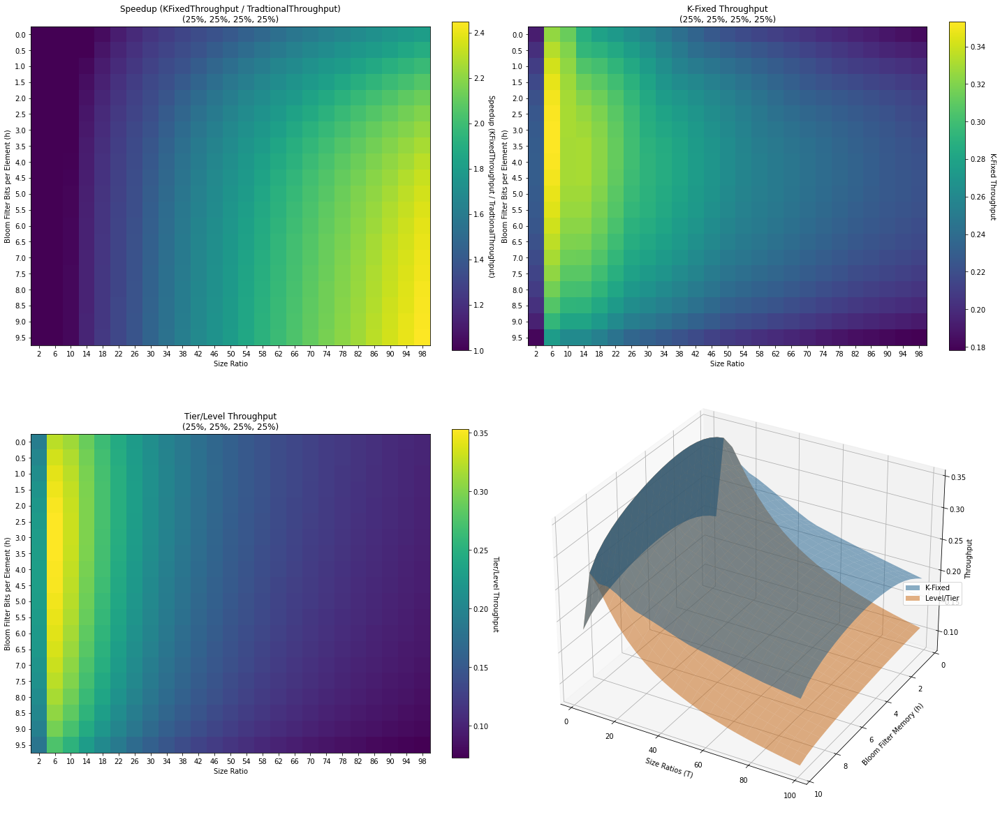

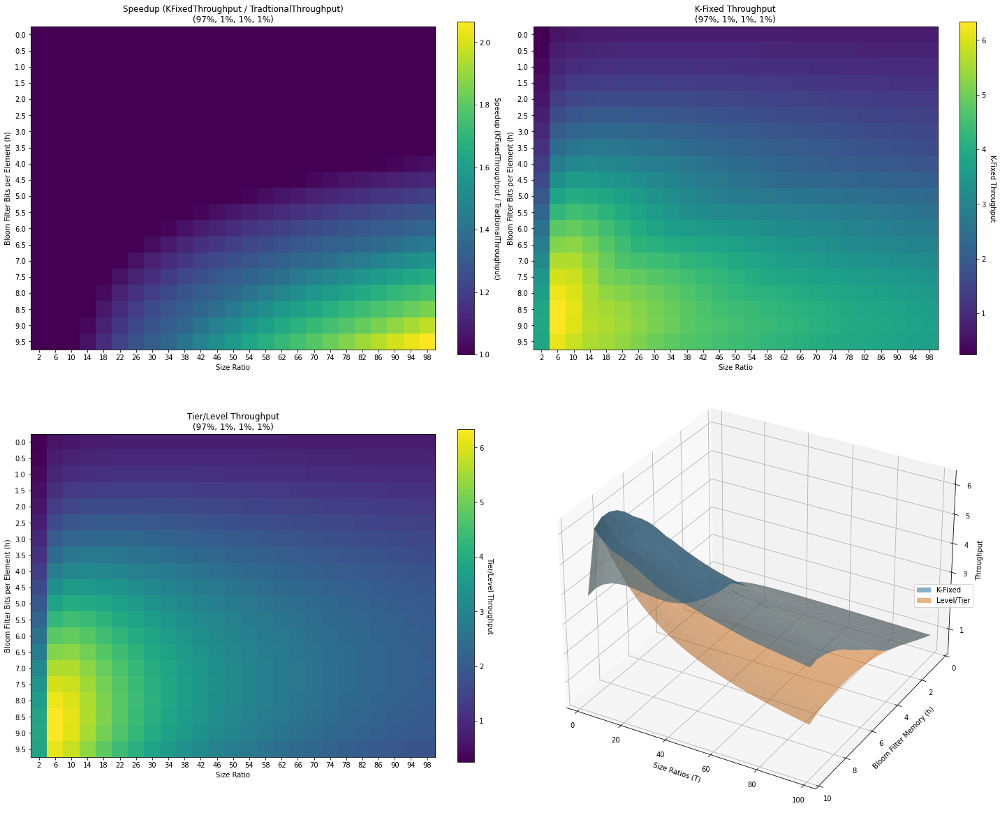

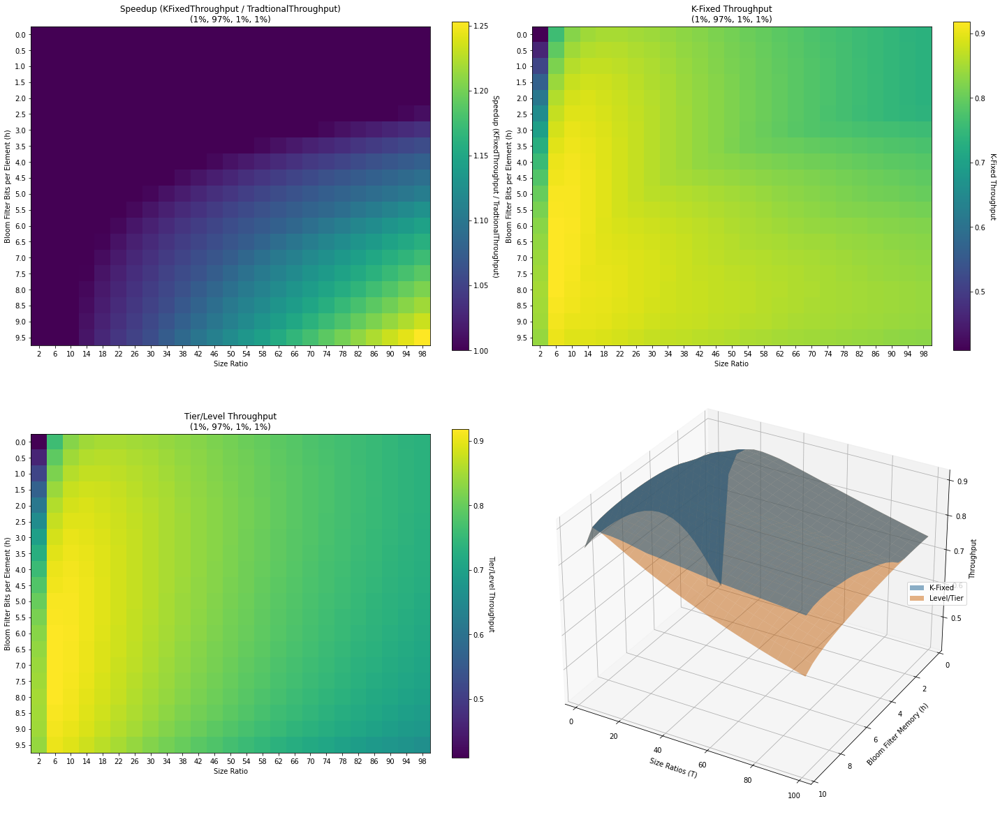

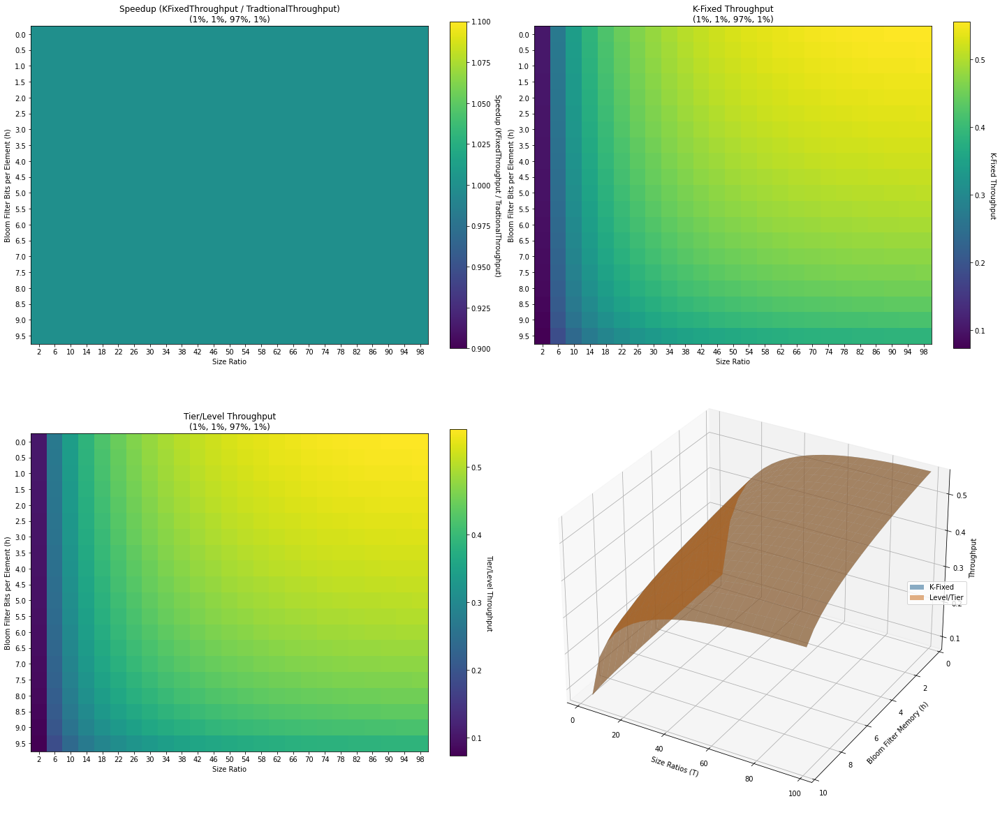

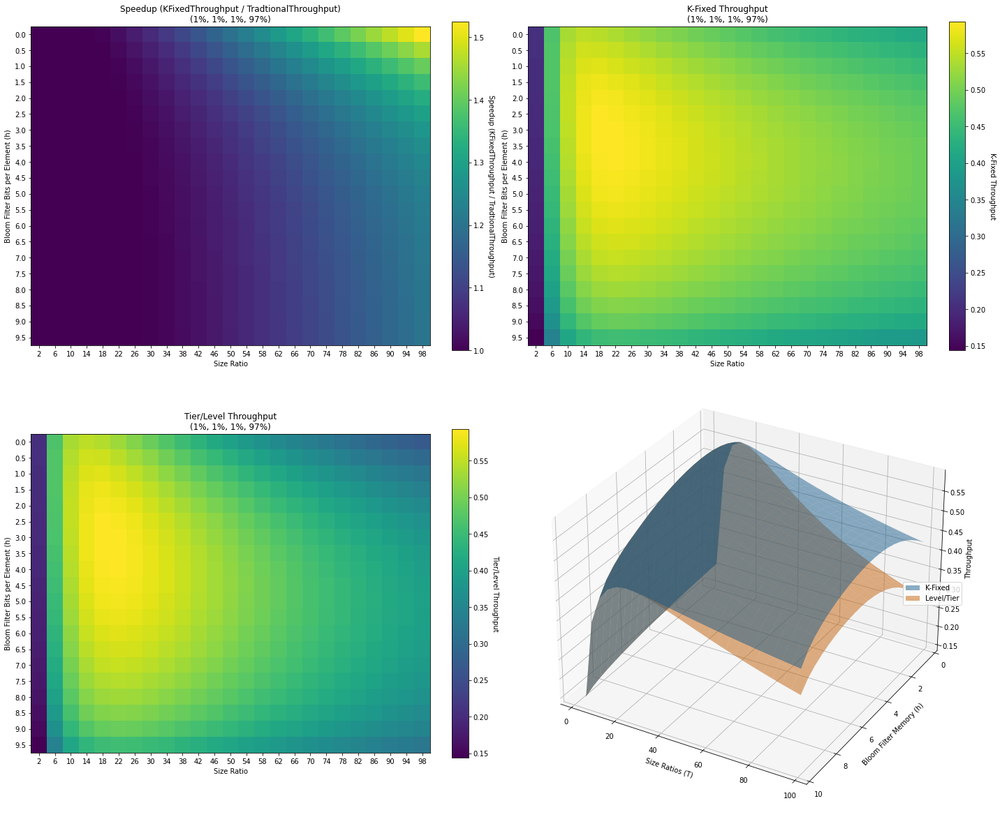

...

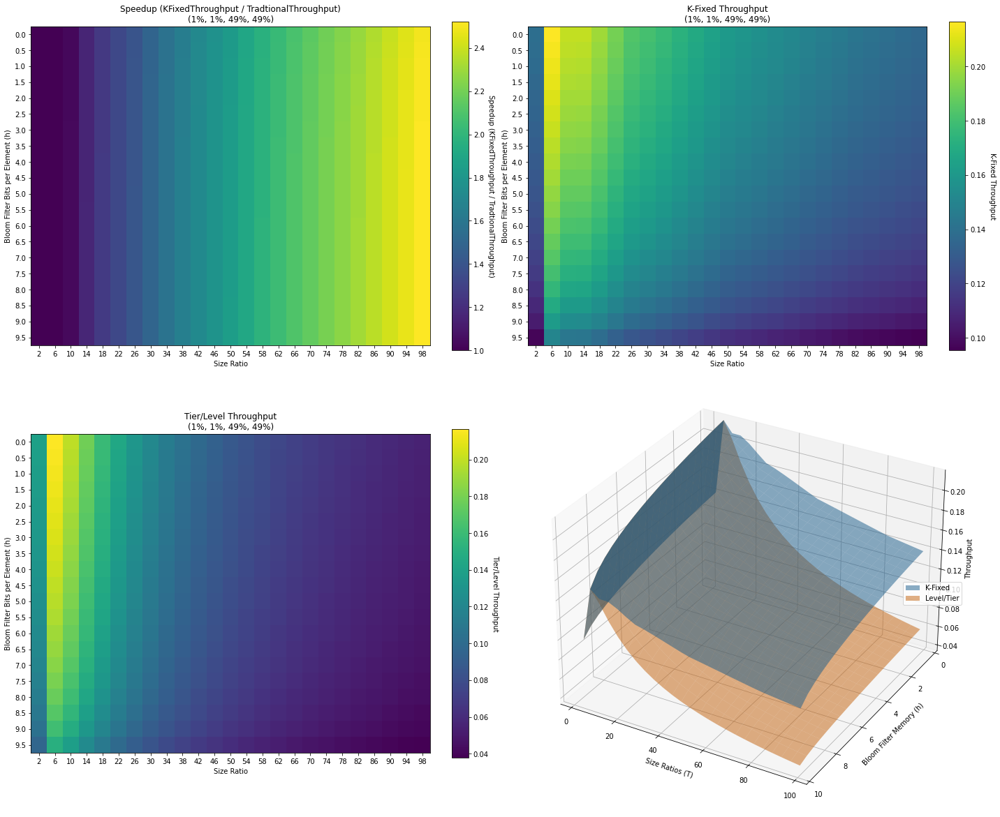

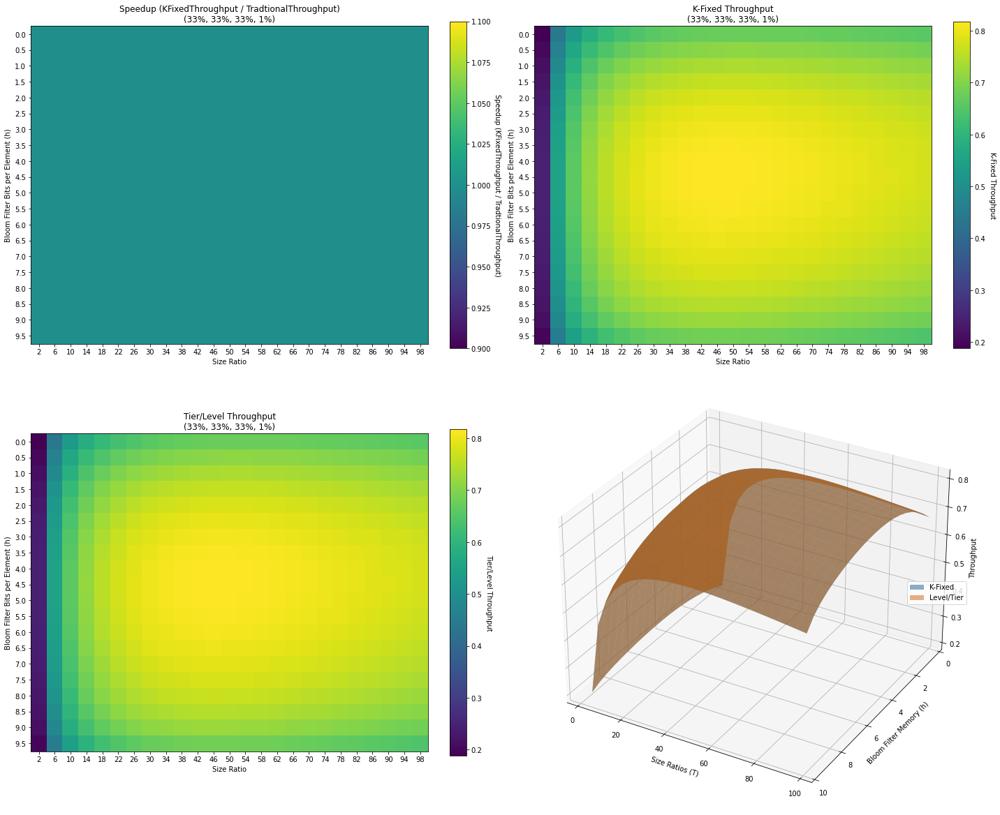

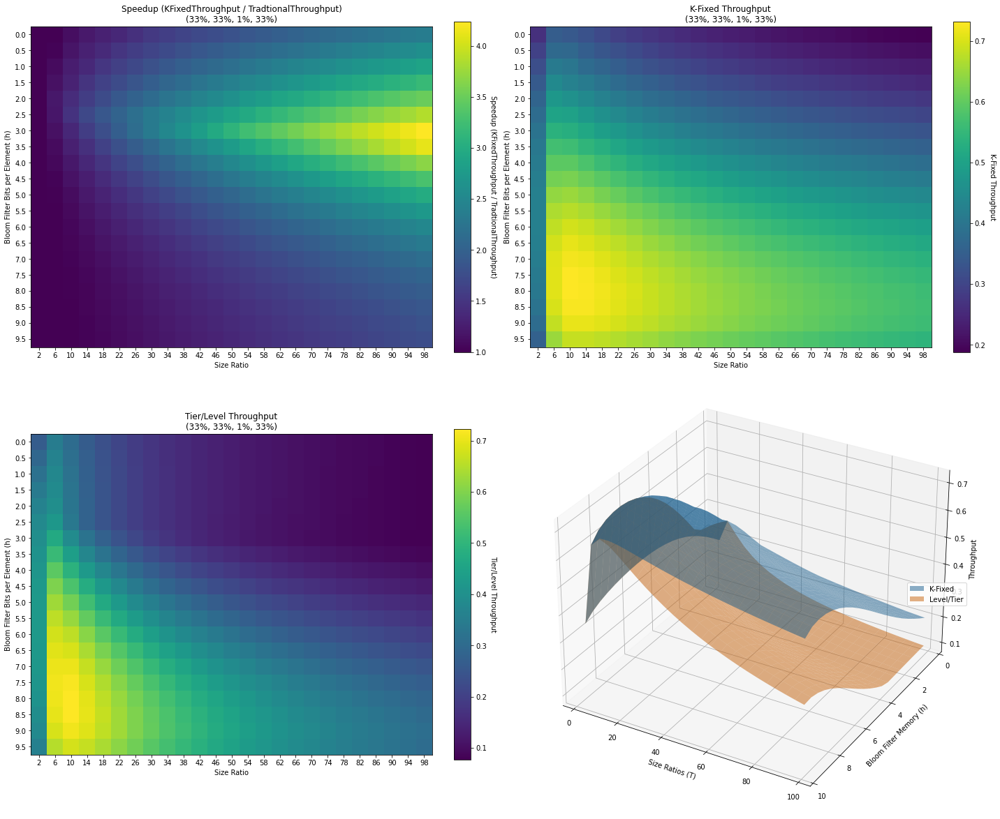

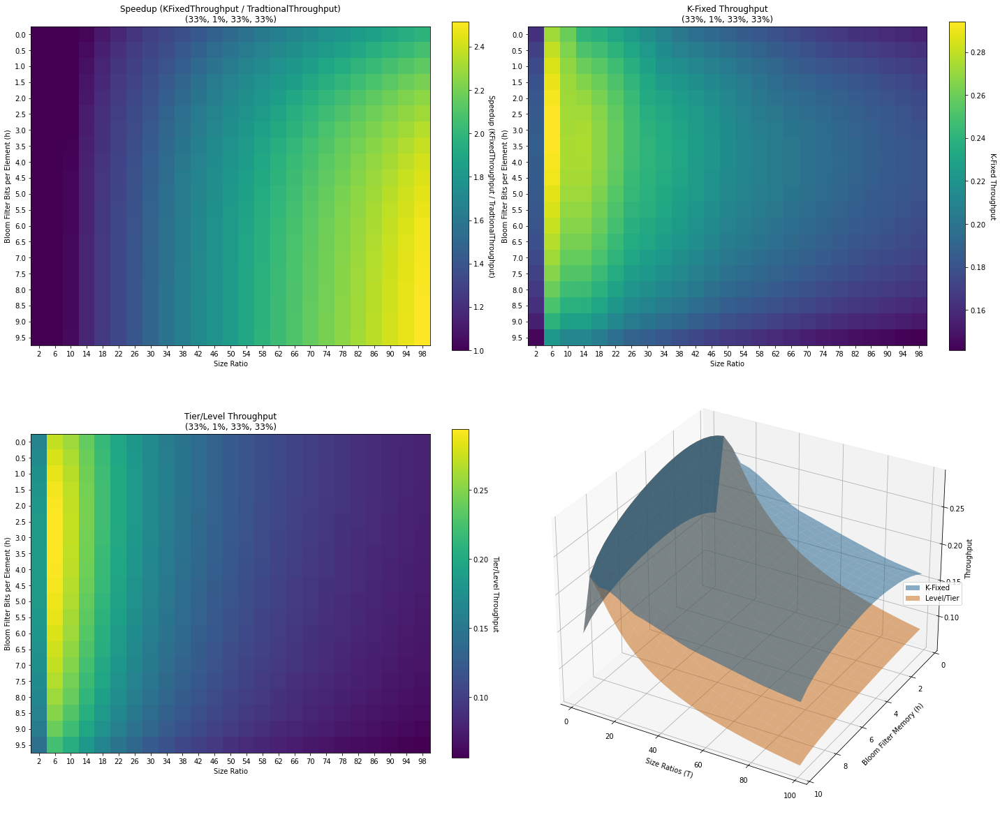

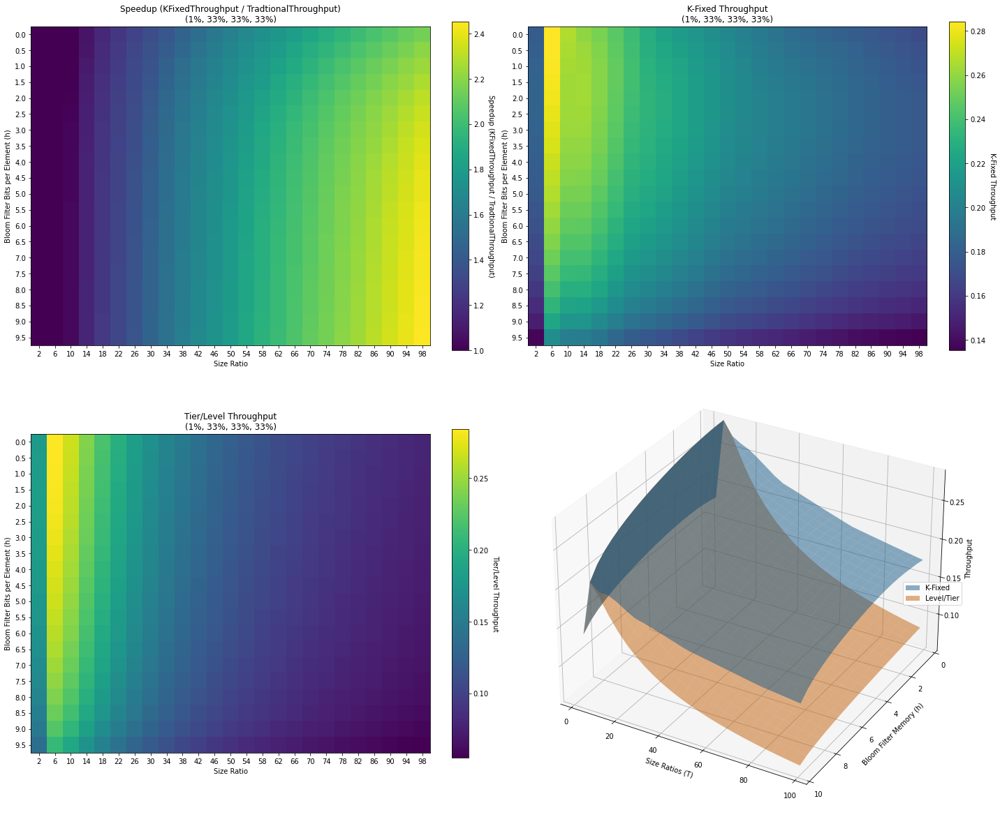

In [8]:
base_size = 20
size_ratios, filter_mem = landscape['T'].unique(), landscape['h'].unique()

for wl in config['inputs']['workloads']:
    wl_id, z0, z1, q, w = wl_to_array(wl)
    fig = plt.figure(figsize=(base_size, base_size))
    axes = [fig.add_subplot(2, 2, 1), fig.add_subplot(2, 2, 2), fig.add_subplot(2, 2, 3)]
    heat_speedup = landscape.query(f'wl_id == {wl_id}')['speedup'].values.reshape(filter_mem.size, size_ratios.size)
    heat_q_tp = landscape.query(f'wl_id == {wl_id}')['new_tp'].values.reshape(filter_mem.size, size_ratios.size)
    heat_old_tp = landscape.query(f'wl_id == {wl_id}')['old_tp'].values.reshape(filter_mem.size, size_ratios.size)
    heats = [heat_speedup, heat_q_tp, heat_old_tp]
    labels = ['Speedup (KFixedThroughput / TradtionalThroughput)', 'K-Fixed Throughput', 'Tier/Level Throughput']

    for heat, ax, label in zip(heats, axes, labels):
        im, cbar = heatmap(
            heat,
            size_ratios,
            filter_mem,
            ax=ax,
            row_label='Size Ratio',
            col_label='Bloom Filter Bits per Element (h)',
            cbar_label=label,
            title = f'{label}\n({z0:.0%}, {z1:.0%}, {q:.0%}, {w:.0%})',
        )
    
    ax = fig.add_subplot(2, 2, 4, projection='3d')
    surf1, surf2 = surface_plot(landscape, ax=ax, legend_on=True, xlabel='Size Ratios (T)', ylabel='Bloom Filter Memory (h)', zlabel='Throughput')
    axes.append(ax)
    fig.tight_layout()
    plt.subplots_adjust(hspace=-0.3)
    fig.savefig(f'/Users/ndhuynh/Desktop/costs/wl_{wl_id}.pdf', format='pdf', bbox_inches = 'tight')

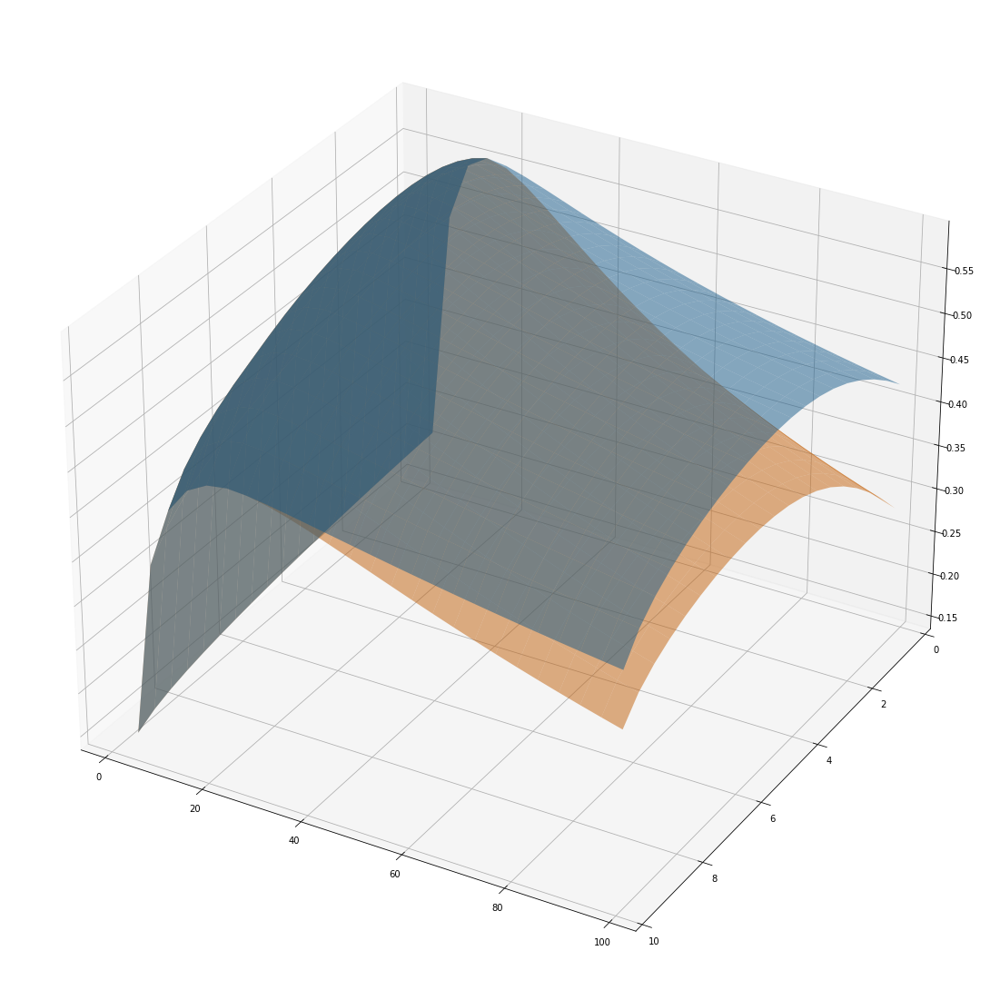

In [9]:
wl_id = 4
size_ratios, filter_mem = landscape['T'].unique(), landscape['h'].unique()

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(1*base_size, base_size), subplot_kw={'projection': '3d'})
_ = surface_plot(landscape, ax=ax)

In [10]:
any(landscape.query('wl_id == 0')['speedup'] < 1)

False

In [11]:
df = reader.read_csv('cost_surface_yz_cost.csv')
landscape = (
    df.groupby(['wl_id', 'h', 'T'])[['new_cost', 'old_cost']]
        .min()
        .reset_index()
        .assign(
            new_tp=lambda row: 1 / row['new_cost'],
            old_tp=lambda row: 1 / row['old_cost'],
        )
        .assign(
            speedup=lambda row: row['new_tp'] / row['old_tp'],
        )
)

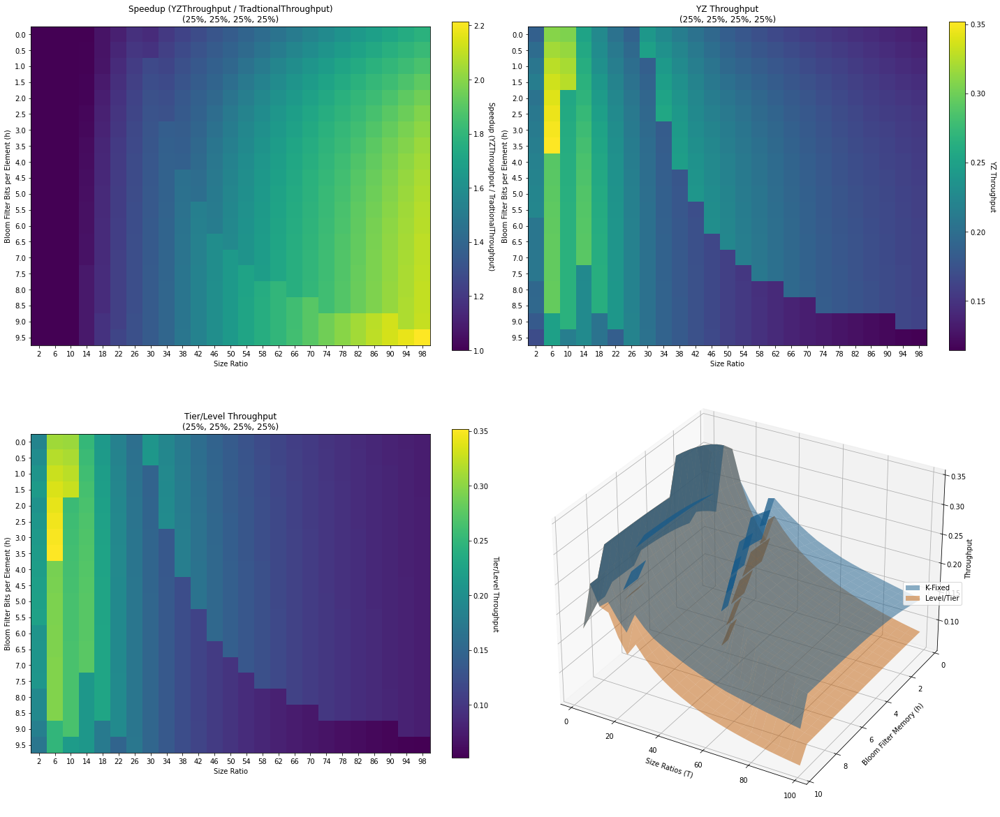

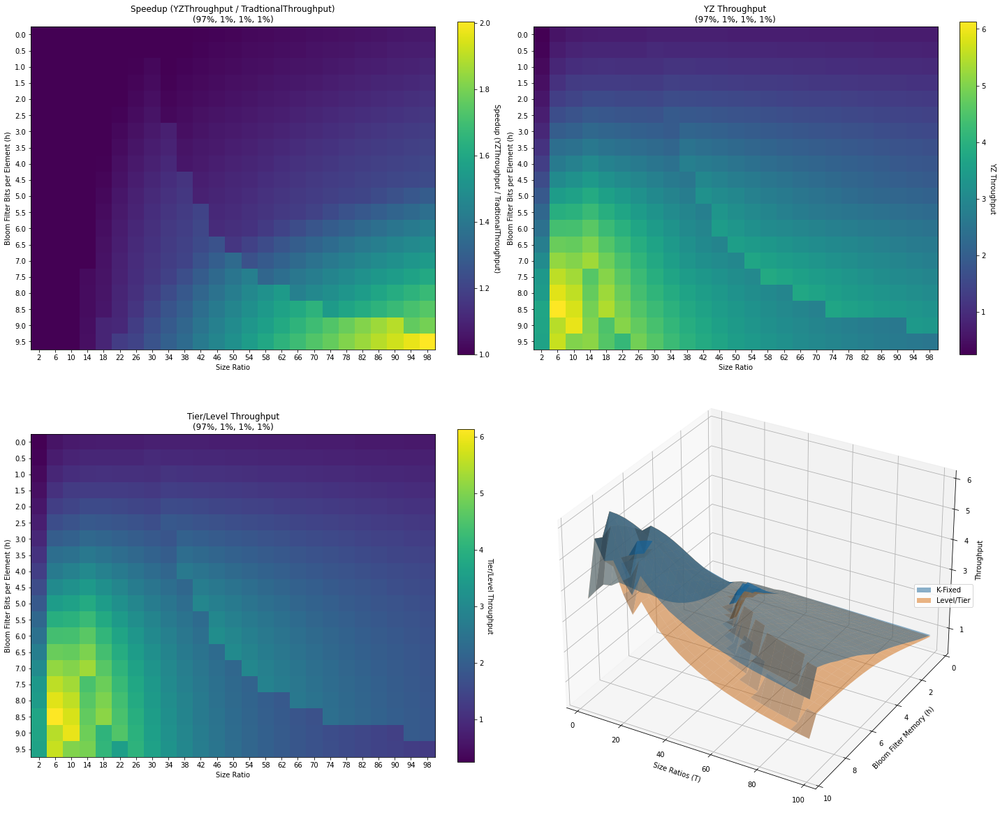

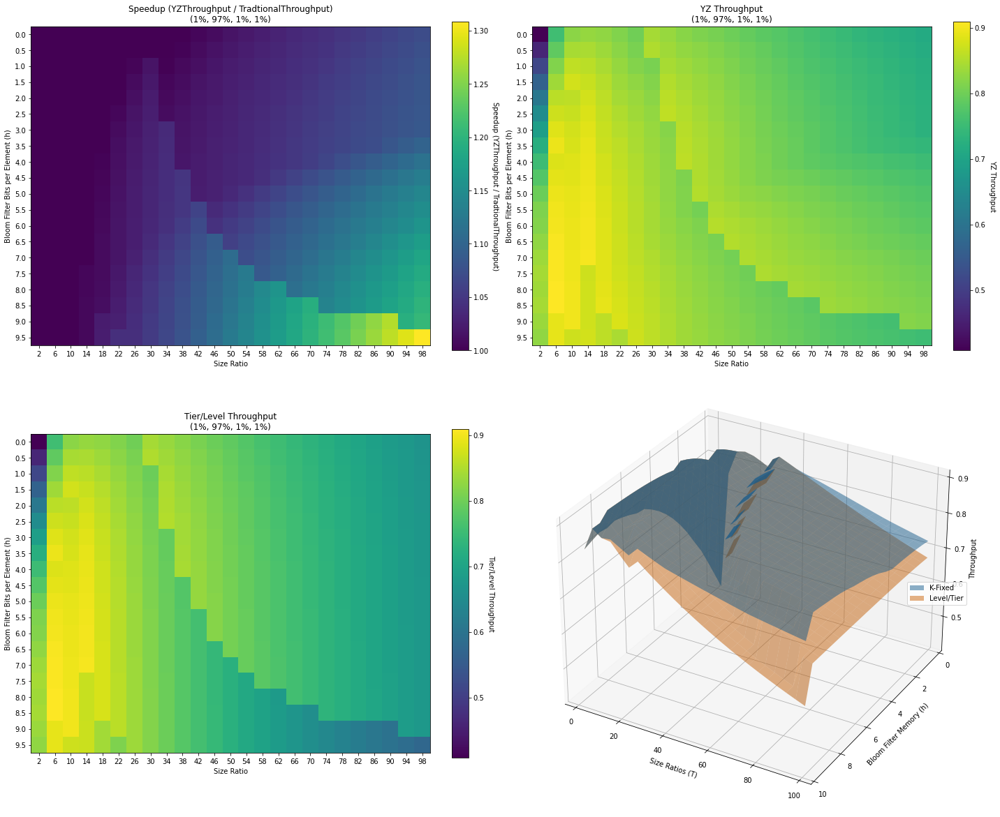

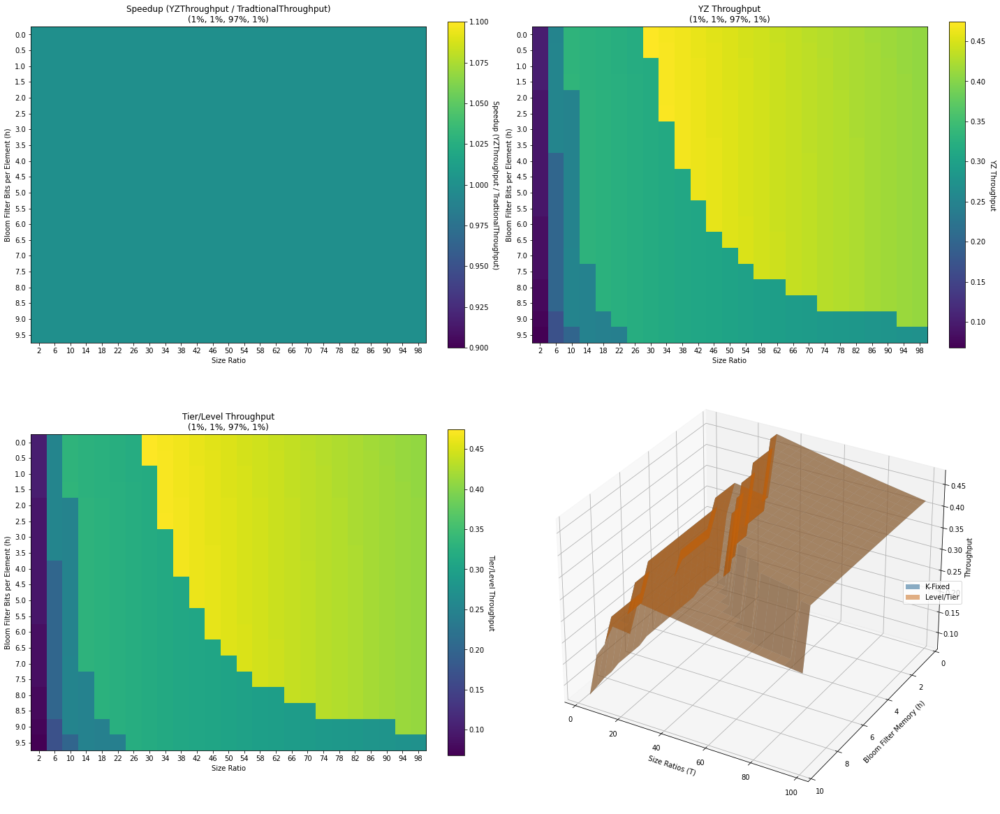

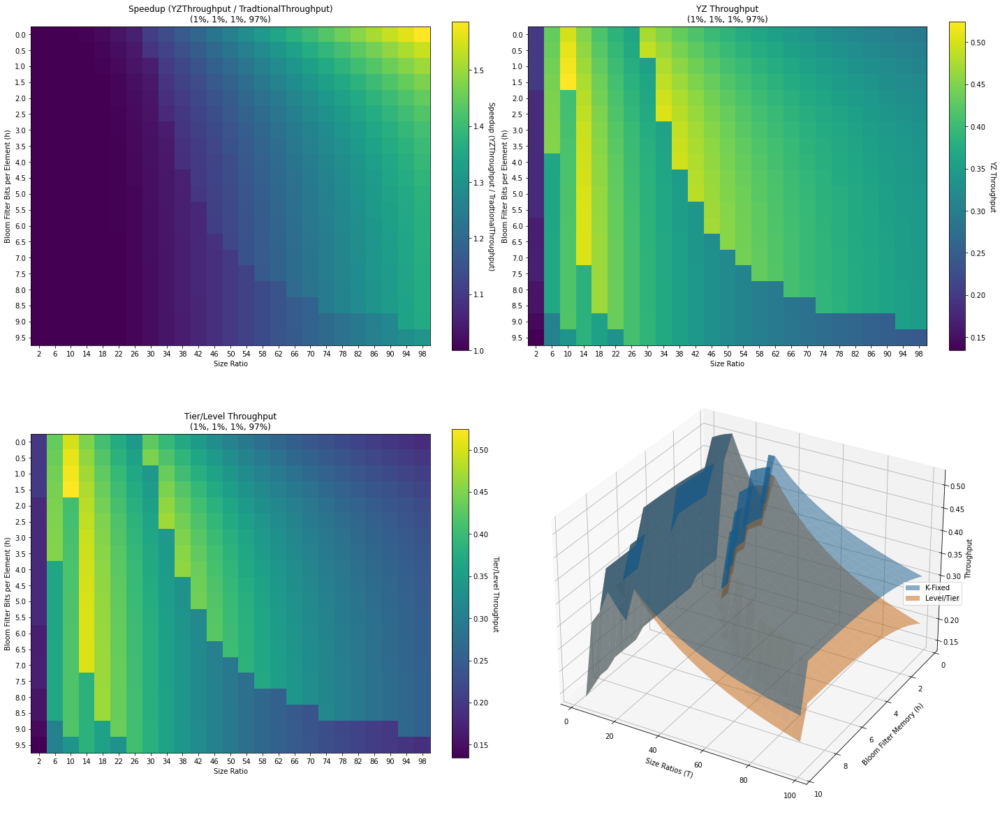

...

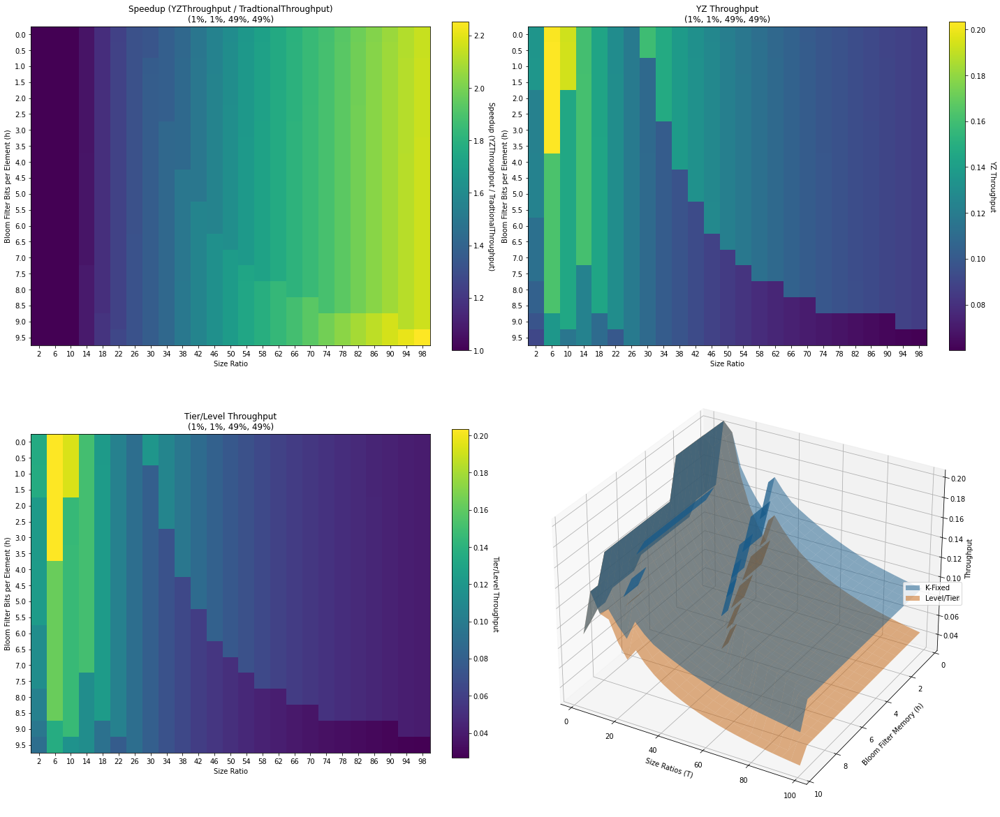

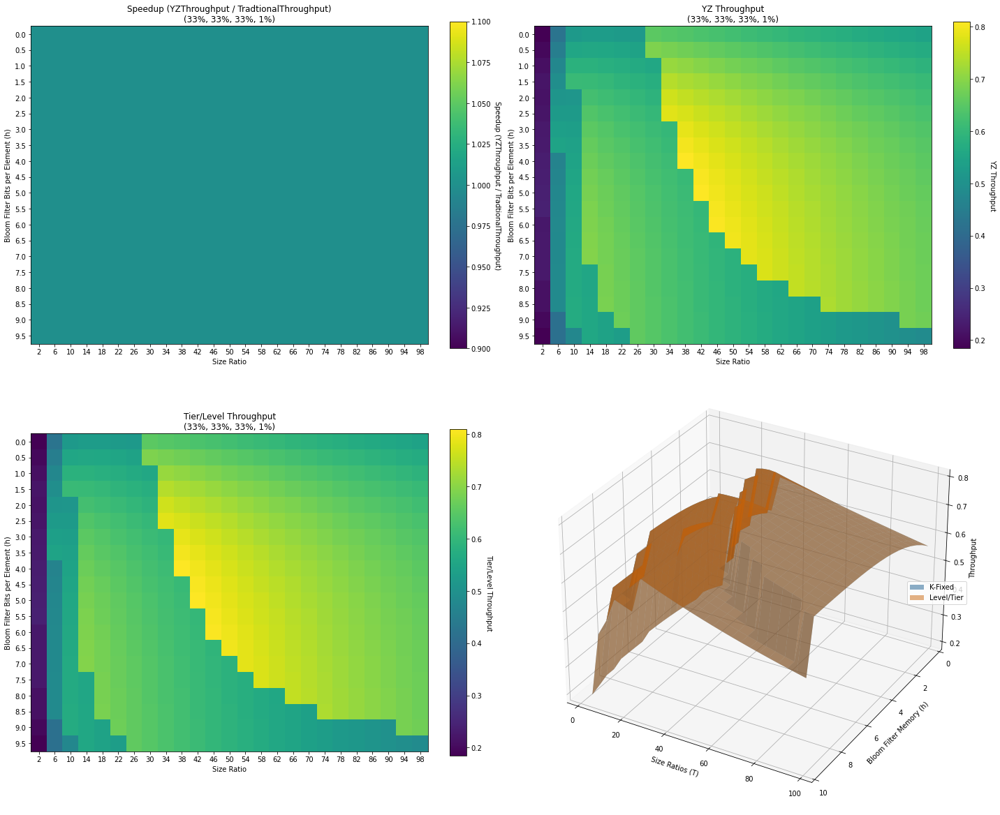

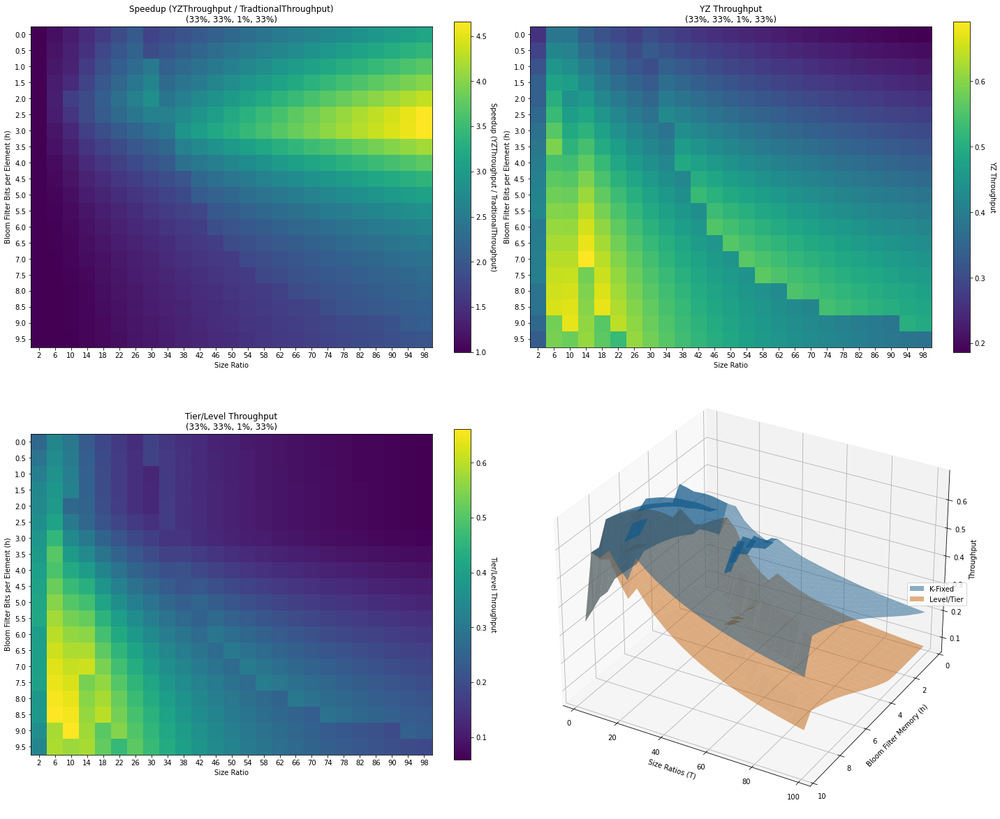

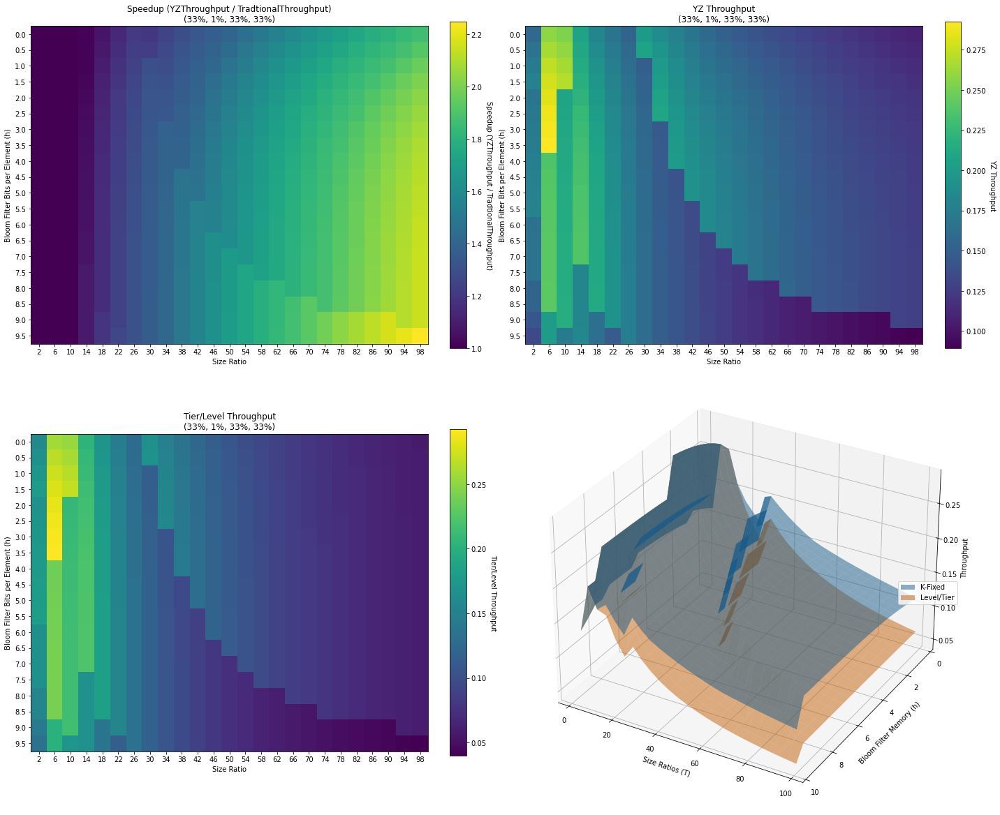

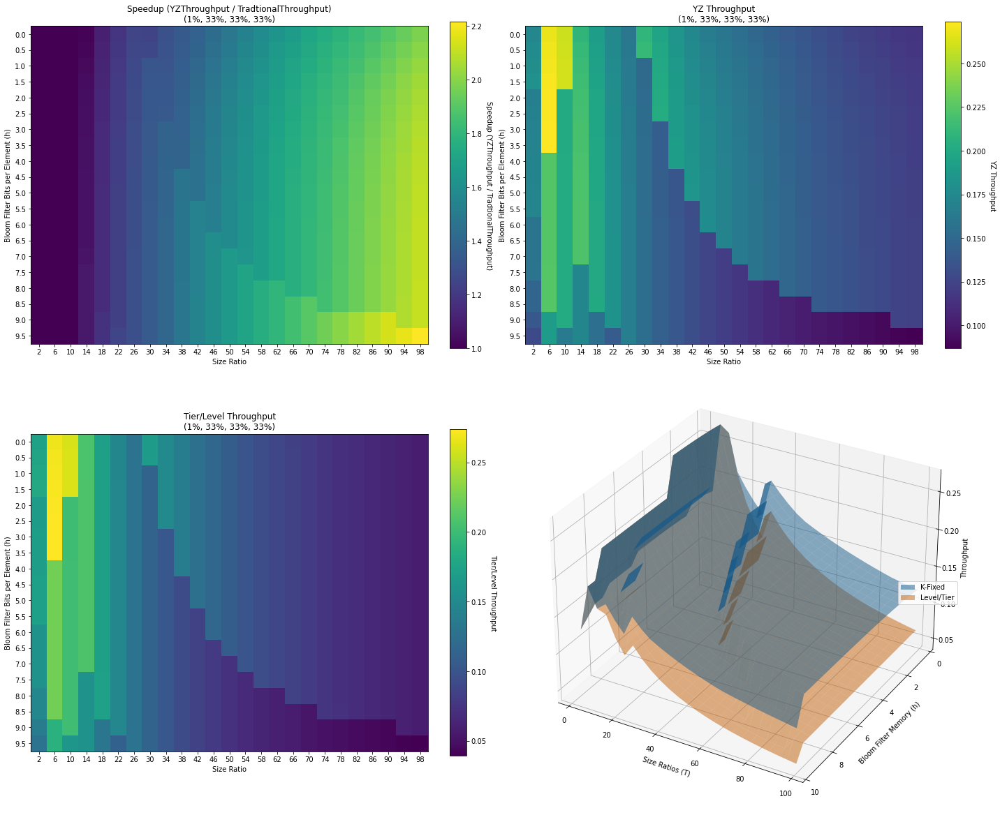

In [12]:
base_size = 20
size_ratios, filter_mem = landscape['T'].unique(), landscape['h'].unique()

for wl in config['inputs']['workloads']:
    wl_id, z0, z1, q, w = wl_to_array(wl)
    fig = plt.figure(figsize=(base_size, base_size))
    axes = [fig.add_subplot(2, 2, 1), fig.add_subplot(2, 2, 2), fig.add_subplot(2, 2, 3)]
    heat_speedup = landscape.query(f'wl_id == {wl_id}')['speedup'].values.reshape(filter_mem.size, size_ratios.size)
    heat_q_tp = landscape.query(f'wl_id == {wl_id}')['new_tp'].values.reshape(filter_mem.size, size_ratios.size)
    heat_old_tp = landscape.query(f'wl_id == {wl_id}')['old_tp'].values.reshape(filter_mem.size, size_ratios.size)
    heats = [heat_speedup, heat_q_tp, heat_old_tp]
    labels = ['Speedup (YZThroughput / TradtionalThroughput)', 'YZ Throughput', 'Tier/Level Throughput']

    for heat, ax, label in zip(heats, axes, labels):
        im, cbar = heatmap(
            heat,
            size_ratios,
            filter_mem,
            ax=ax,
            row_label='Size Ratio',
            col_label='Bloom Filter Bits per Element (h)',
            cbar_label=label,
            title = f'{label}\n({z0:.0%}, {z1:.0%}, {q:.0%}, {w:.0%})',
        )
    
    ax = fig.add_subplot(2, 2, 4, projection='3d')
    surf1, surf2 = surface_plot(landscape, ax=ax, legend_on=True, xlabel='Size Ratios (T)', ylabel='Bloom Filter Memory (h)', zlabel='Throughput')
    axes.append(ax)
    fig.tight_layout()
    plt.subplots_adjust(hspace=-0.3)

In [16]:
df.query('wl_id == 0 and norm_delta > 0').sort_values(by='norm_delta')

,wl_id,h,T,z0,z1,q,w,Y,Z,new_cost,tier_cost,level_cost,old_cost,delta,norm_delta
89188,0,1.0,58,0.25,0.25,0.25,0.25,7,6,6.925169,52.735841,6.925271,6.925271,0.000102,0.000015
510326,0,6.0,78,0.25,0.25,0.25,0.25,15,5,9.234797,54.885313,9.234957,9.234957,0.000161,0.000017
680782,0,8.0,86,0.25,0.25,0.25,0.25,17,6,10.759621,61.890426,10.759850,10.759850,0.000229,0.000021
374921,0,4.5,54,0.25,0.25,0.25,0.25,6,1,6.921691,40.246366,6.922267,6.922267,0.000576,0.000083
210839,0,2.5,54,0.25,0.25,0.25,0.25,8,6,6.691571,43.237008,6.692544,6.692544,0.000973,0.000145
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
815761,0,9.5,98,0.25,0.25,0.25,0.25,5,5,6.613521,76.239897,13.745527,13.745527,7.132006,0.518860
733706,0,8.5,98,0.25,0.25,0.25,0.25,4,4,5.863514,70.646668,12.219889,12.219889,6.356375,0.520166
811385,0,9.5,94,0.25,0.25,0.25,0.25,4,4,6.388409,73.561403,13.335313,13.335313,6.946904,0.520940
774731,0,9.0,98,0.25,0.25,0.25,0.25,4,4,6.086225,72.663816,12.782606,12.782606,6.696381,0.523867


In [14]:
df = reader.read_csv('cost_surface_yz_cost_smooth_correction.csv')
landscape = (
    df.groupby(['wl_id', 'h', 'T'])[['new_cost', 'old_cost']]
        .min()
        .reset_index()
        .assign(
            new_tp=lambda row: 1 / row['new_cost'],
            old_tp=lambda row: 1 / row['old_cost'],
        )
        .assign(
            speedup=lambda row: row['new_tp'] / row['old_tp'],
        )
)
df.describe().transpose()

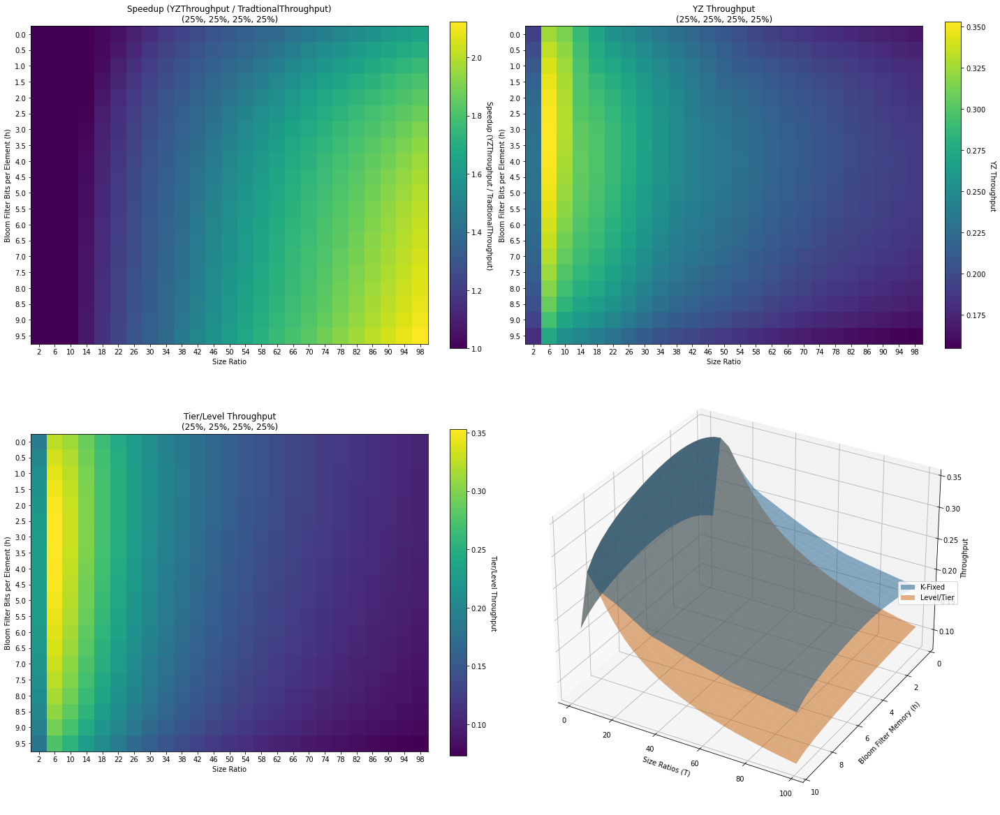

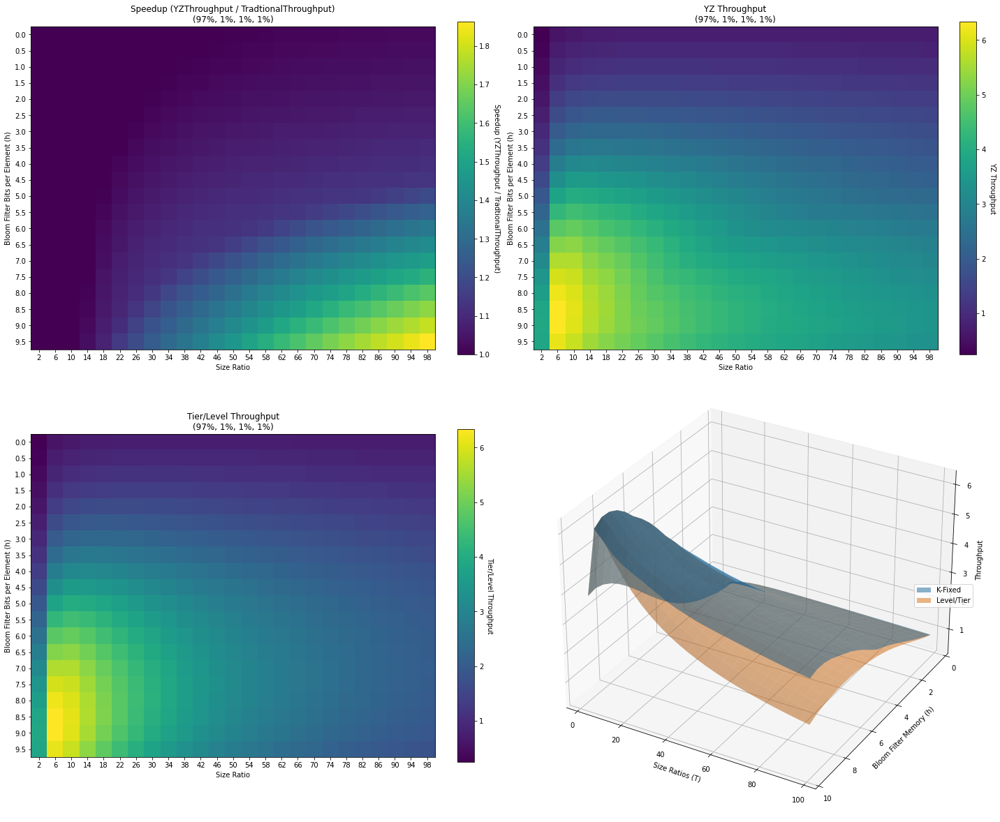

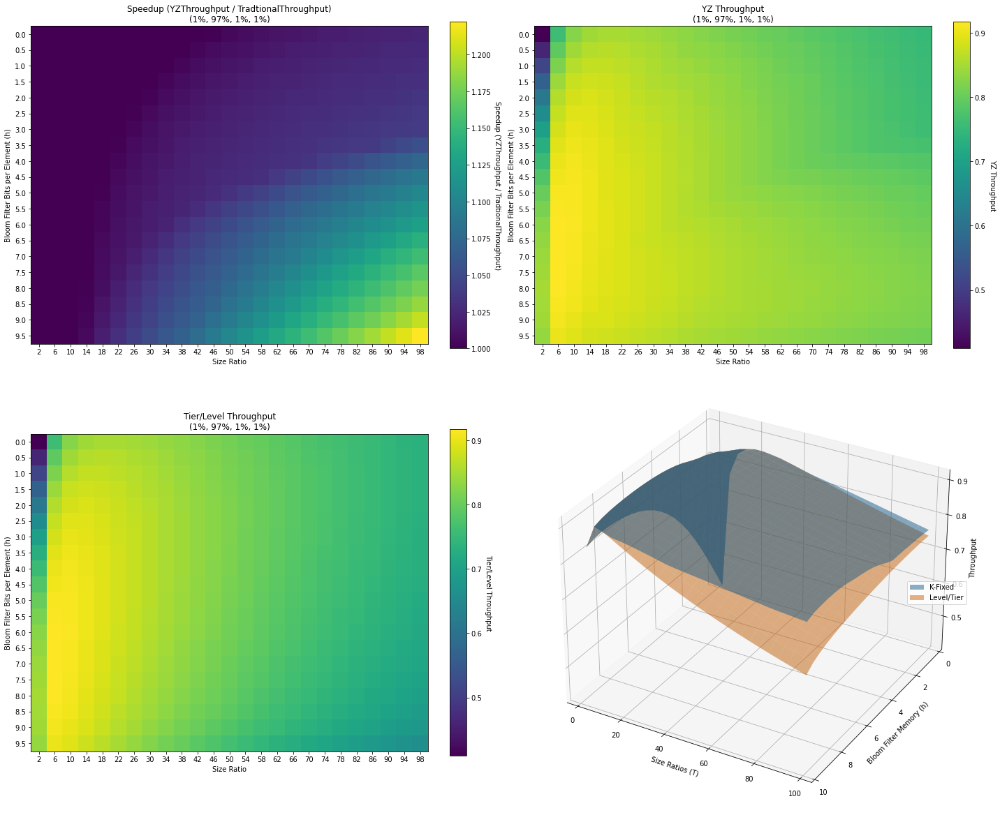

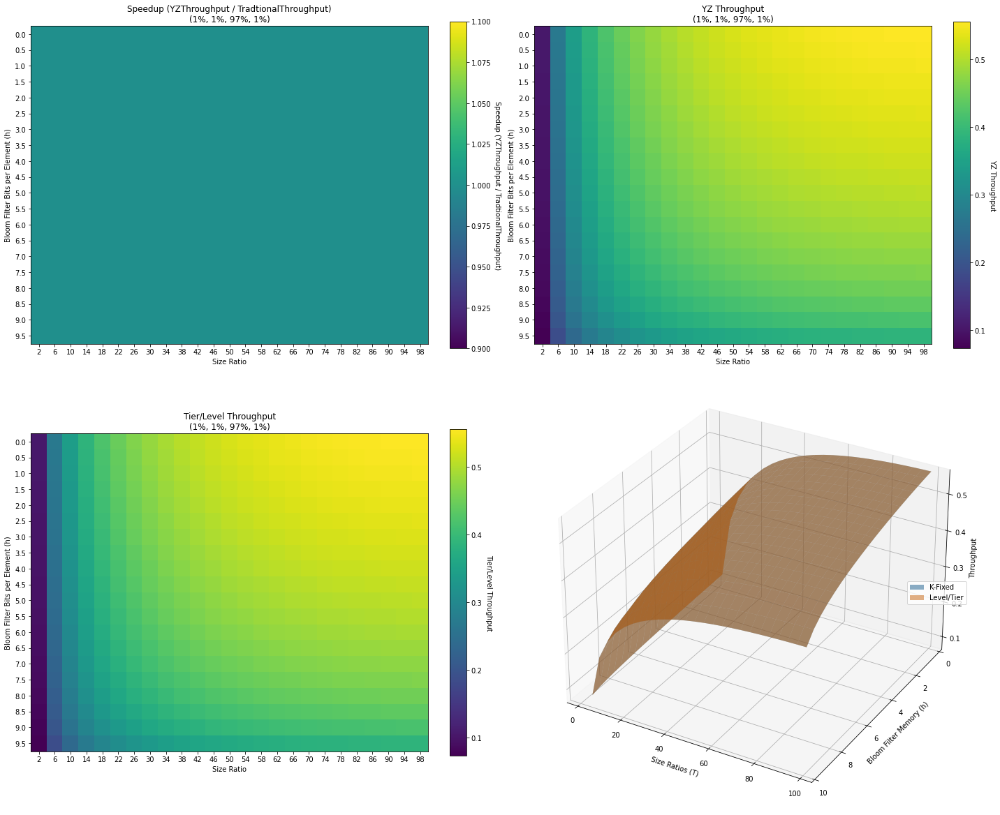

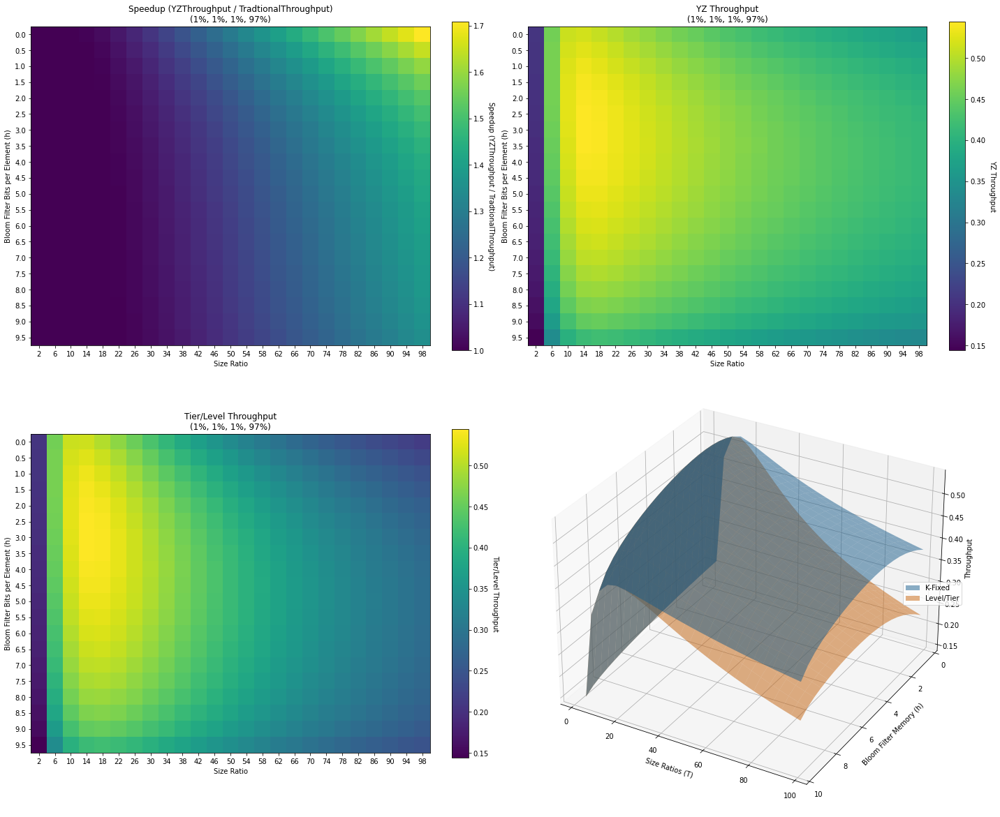

...

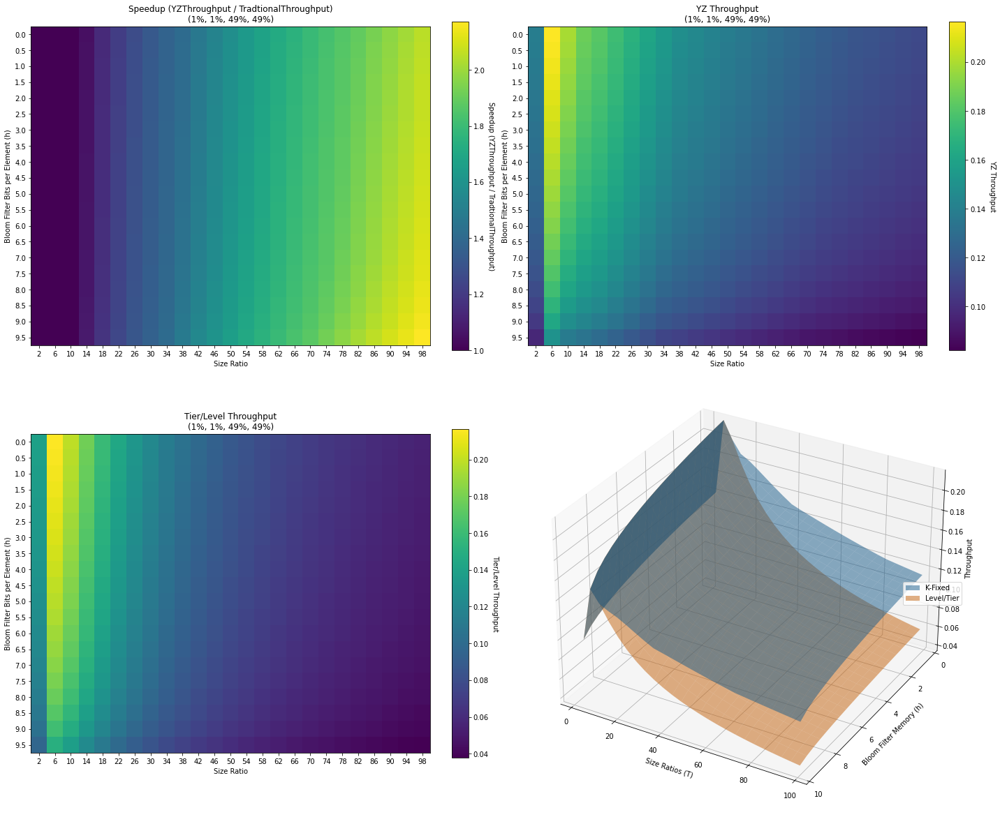

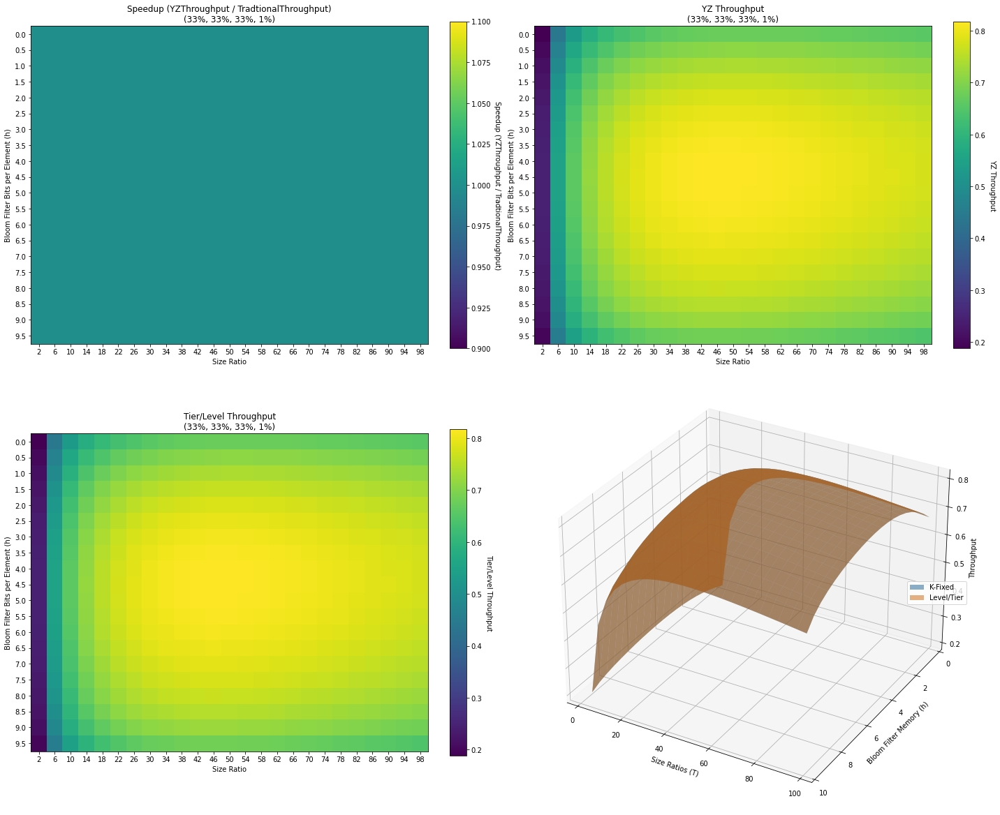

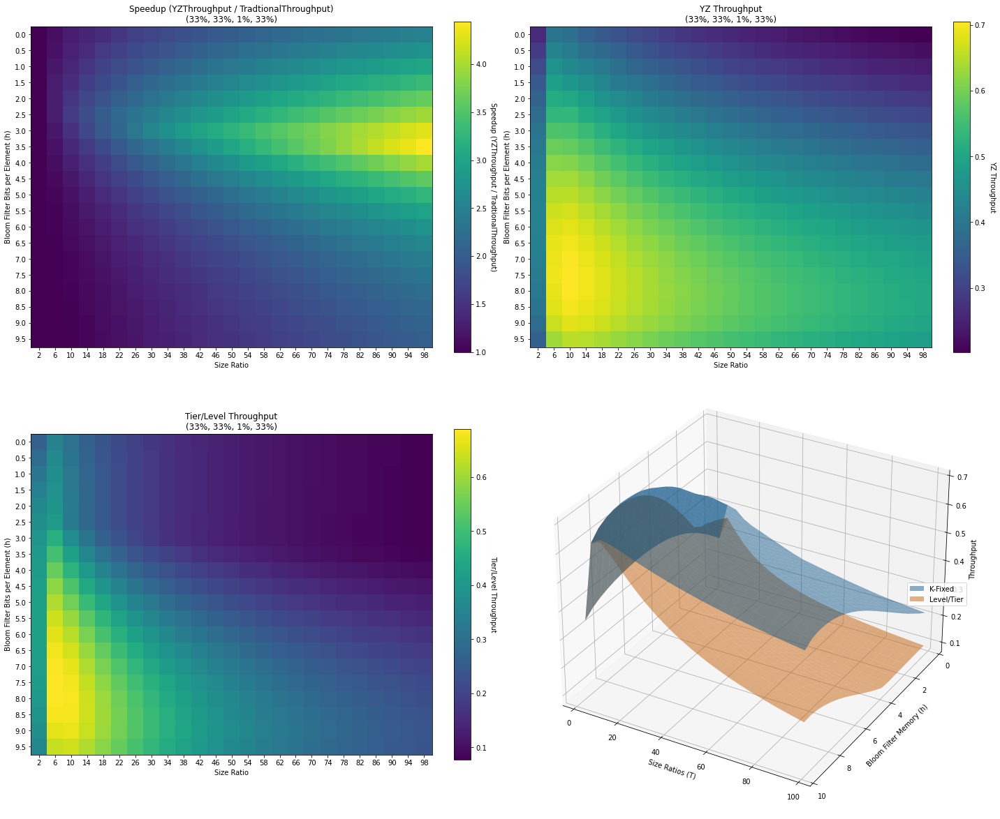

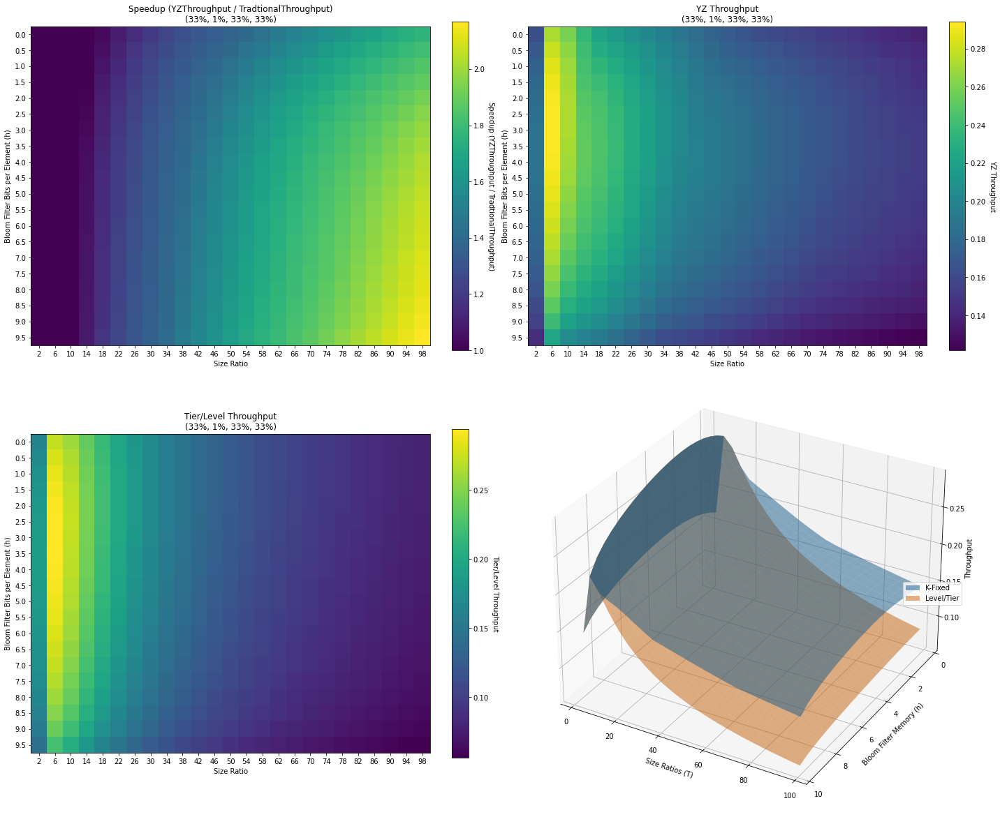

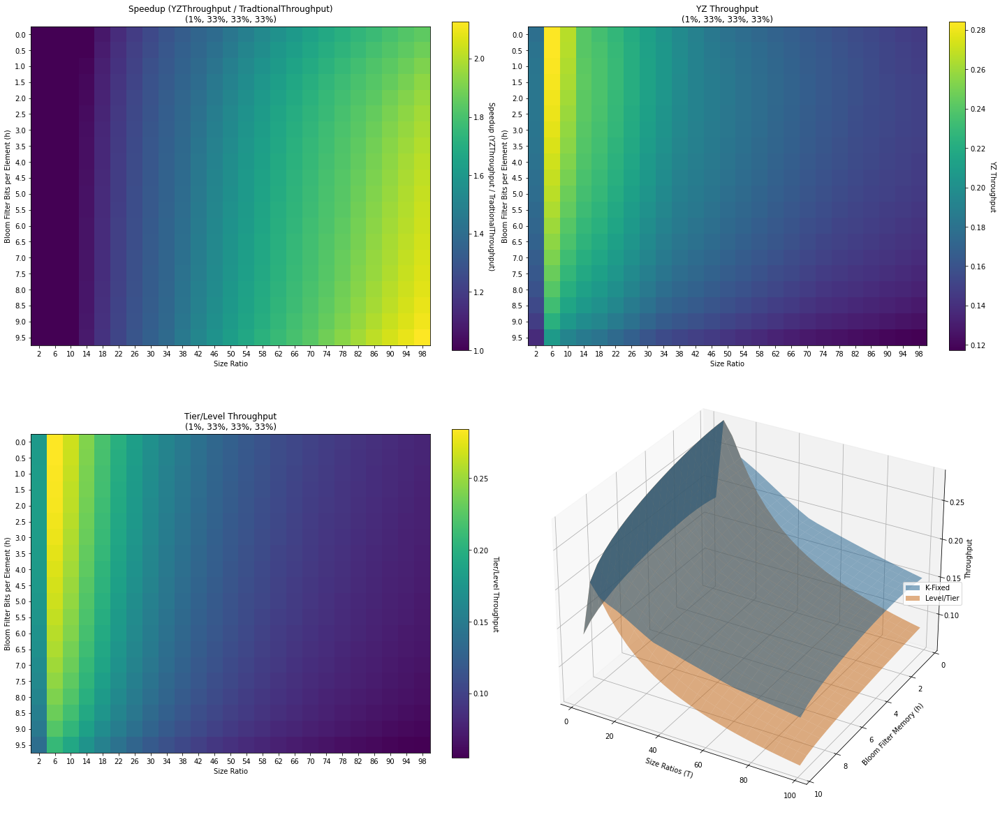

In [15]:
base_size = 20
size_ratios, filter_mem = landscape['T'].unique(), landscape['h'].unique()

for wl in config['inputs']['workloads']:
    wl_id, z0, z1, q, w = wl_to_array(wl)
    fig = plt.figure(figsize=(base_size, base_size))
    axes = [fig.add_subplot(2, 2, 1), fig.add_subplot(2, 2, 2), fig.add_subplot(2, 2, 3)]
    heat_speedup = landscape.query(f'wl_id == {wl_id}')['speedup'].values.reshape(filter_mem.size, size_ratios.size)
    heat_q_tp = landscape.query(f'wl_id == {wl_id}')['new_tp'].values.reshape(filter_mem.size, size_ratios.size)
    heat_old_tp = landscape.query(f'wl_id == {wl_id}')['old_tp'].values.reshape(filter_mem.size, size_ratios.size)
    heats = [heat_speedup, heat_q_tp, heat_old_tp]
    labels = ['Speedup (YZThroughput / TradtionalThroughput)', 'YZ Throughput', 'Tier/Level Throughput']

    for heat, ax, label in zip(heats, axes, labels):
        im, cbar = heatmap(
            heat,
            size_ratios,
            filter_mem,
            ax=ax,
            row_label='Size Ratio',
            col_label='Bloom Filter Bits per Element (h)',
            cbar_label=label,
            title = f'{label}\n({z0:.0%}, {z1:.0%}, {q:.0%}, {w:.0%})',
        )
    
    ax = fig.add_subplot(2, 2, 4, projection='3d')
    surf1, surf2 = surface_plot(landscape, ax=ax, legend_on=True, xlabel='Size Ratios (T)', ylabel='Bloom Filter Memory (h)', zlabel='Throughput')
    axes.append(ax)
    fig.tight_layout()
    plt.subplots_adjust(hspace=-0.3)